In [1]:
import demo_utils
import numpy as np
import torch
from PIL import Image
import imagenet_classes
from IPython.display import display
import os
from huggingface_hub import hf_hub_download

from torchvision import transforms

In [2]:
torch.backends.cuda.matmul.allow_tf32 = True
torch.manual_seed(0);

# Prepare MaskBit tokenizer and generator

In [3]:
TOKENIZER_PATH = "./"
GENERATOR_PATH = "./"

hf_hub_download(repo_id="markweber/maskbit_tokenizer_14bit", filename="maskbit_tokenizer_14bit.bin", local_dir=TOKENIZER_PATH);
hf_hub_download(repo_id="markweber/maskbit_generator_14bit", filename="maskbit_generator_14bit.bin", local_dir=GENERATOR_PATH);

In [4]:
demo_config = demo_utils.get_config("./configs/demo/demo.yaml")
print(demo_config)

{'model': {'vq_model': {'model_class': 'vqgan+', 'quantizer_type': 'lookup-free', 'codebook_size': 16384, 'token_size': 14, 'commitment_cost': 0.25, 'entropy_loss_weight': 0.02, 'entropy_loss_temperature': 0.01, 'entropy_gamma': 1.0, 'num_channels': 3, 'hidden_channels': 128, 'channel_mult': [1, 1, 2, 2, 4], 'num_resolutions': 5, 'num_res_blocks': 2, 'sample_with_conv': True}, 'mlm_model': {'model_cls': 'lfq_bert', 'hidden_dim': 1024, 'depth': 24, 'heads': 16, 'mlp_dim': 4096, 'dropout': 0.1, 'codebook_splits': 2, 'use_prenorm': False}}}


In [5]:
tokenizer = demo_utils.get_tokenizer(demo_config, os.path.join(TOKENIZER_PATH, "maskbit_tokenizer_14bit.bin"))
generator = demo_utils.get_generator(demo_config, os.path.join(GENERATOR_PATH, "maskbit_generator_14bit.bin"))

# print(tokenizer)
# print(generator)

In [6]:
device = "cuda:0"

tokenizer = tokenizer.to(device)
generator = generator.to(device)

# Reconstruction

In [7]:
def reconstruct(img_path, resolution=256):
    # Convert to torch, format is CHW range is [0, 1.0]
    transform = transforms.Compose(
        [
            transforms.Resize(resolution, interpolation=transforms.InterpolationMode.BILINEAR),
            transforms.CenterCrop(resolution),
            transforms.ToTensor(),
        ]
    )
    
    original_image = Image.open(img_path).convert('RGB')
    image = transform(original_image).unsqueeze(0)  # Batchsize of 1
    
    encoded_tokens, _  = tokenizer.encode(image.to(device))
    reconstructed_image = tokenizer.decode(encoded_tokens)
    reconstructed_image = torch.clamp(reconstructed_image, 0.0, 1.0) * 255.0
    reconstructed_image = reconstructed_image.cpu()
    
    print("Orignal Image / Reconstructed Image / Difference")
    display(demo_utils.visualize_reconstruction(image * 255.0, reconstructed_image))

Orignal Image / Reconstructed Image / Difference


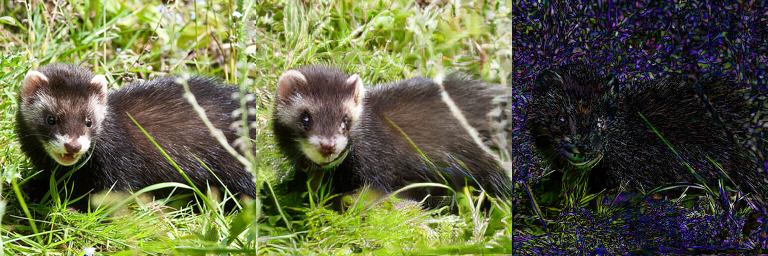

In [8]:
reconstruct("./assets/ILSVRC2012_val_00008636.png")

Orignal Image / Reconstructed Image / Difference


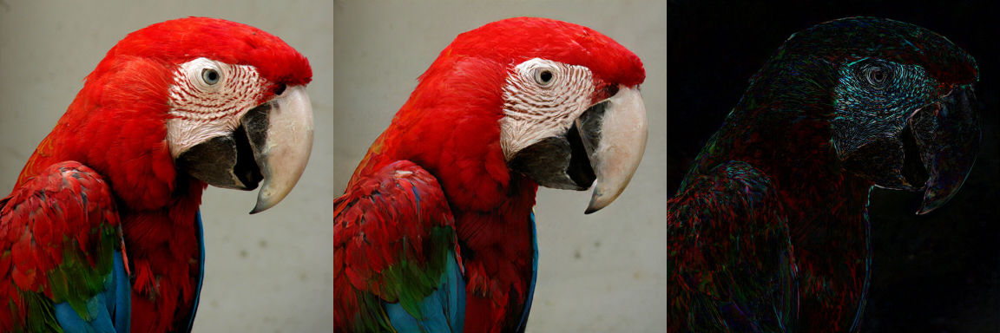

In [9]:
reconstruct("./assets/ILSVRC2012_val_00027656.JPEG", resolution=384)

Orignal Image / Reconstructed Image / Difference


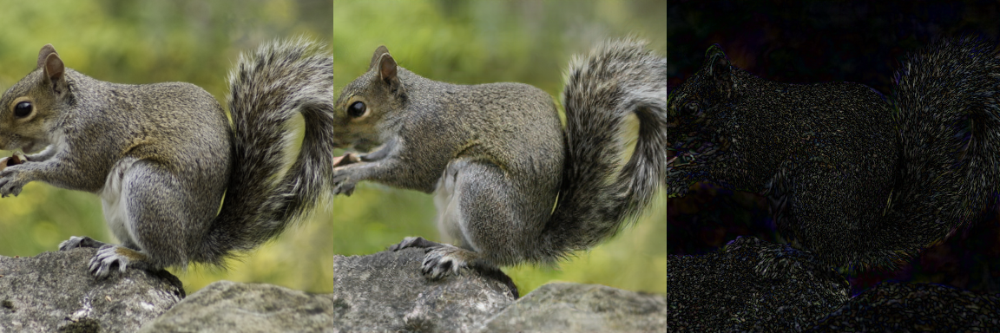

In [10]:
reconstruct("./assets/squirrel.png", resolution=384)

# Generation

In [18]:
# ImageNet classes
# 90 -> lorikeet,
# 207 -> golden retriever
# 250 -> siberian husky,
# 323 -> monarch butterfly,
# 325 -> sulfur butterfly,
# 358 -> weasle,
# 360 -> otter, 
# 417 -> balloon,
# 562 -> fountain, 
# 928 -> ice cream,
# 947 -> mushroom, 
# 970 -> alp,
# 972 -> cliff,
# 973 -> coral reef,
# 975 -> lake side,
# 980 -> volcano

class_indices = [90, 207, 250, 323, 325, 358, 360, 417, 562, 928, 947, 970, 972, 973, 975, 980]
labels = torch.tensor(class_indices, dtype=torch.long, device=device)

Running generation...


Generating samples:   0%|          | 0/16 [00:00<?, ?it/s]

class 90, lorikeet


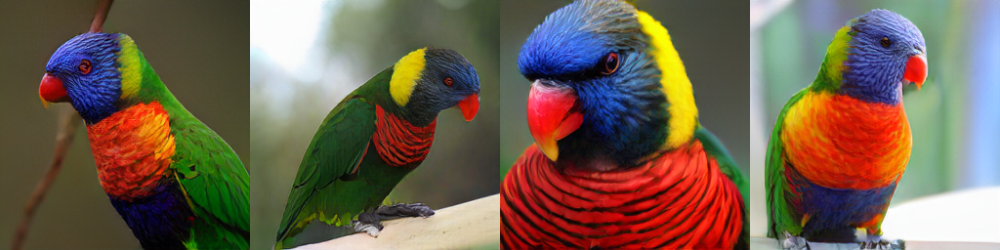

class 207, golden retriever


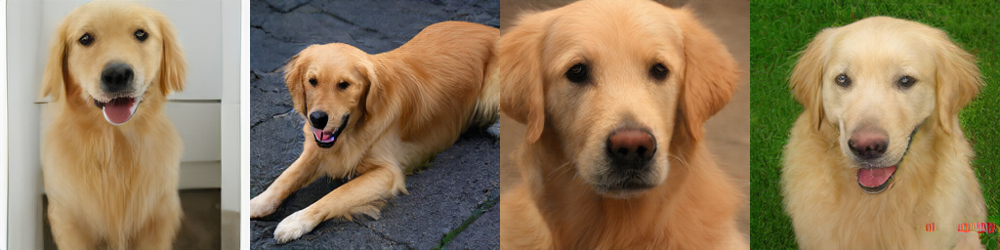

class 250, Siberian husky


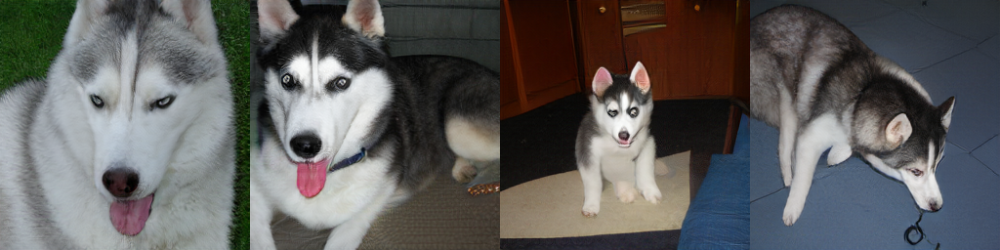

class 323, monarch, monarch butterfly, milkweed butterfly, Danaus plexippus


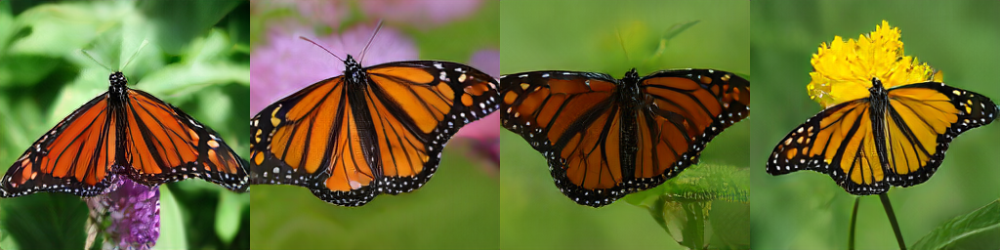

class 325, sulphur butterfly, sulfur butterfly


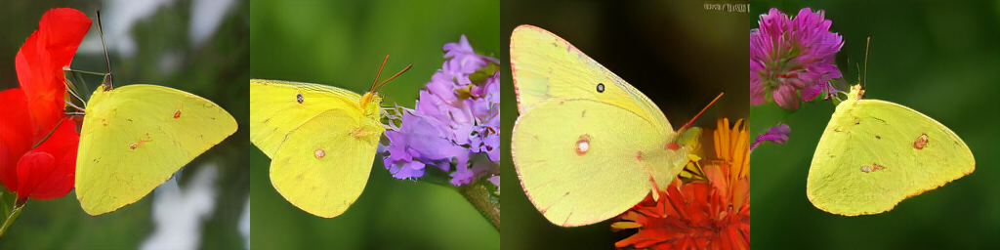

class 358, polecat, fitch, foulmart, foumart, Mustela putorius


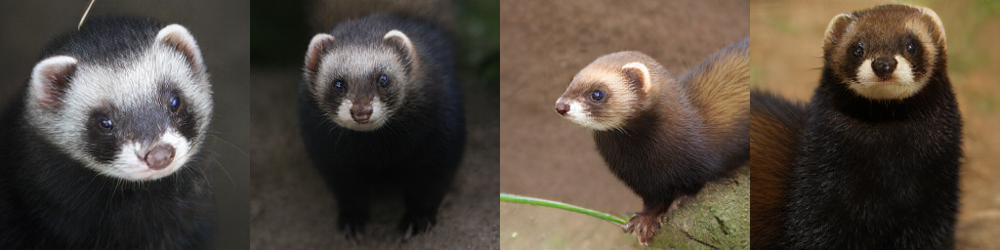

class 360, otter


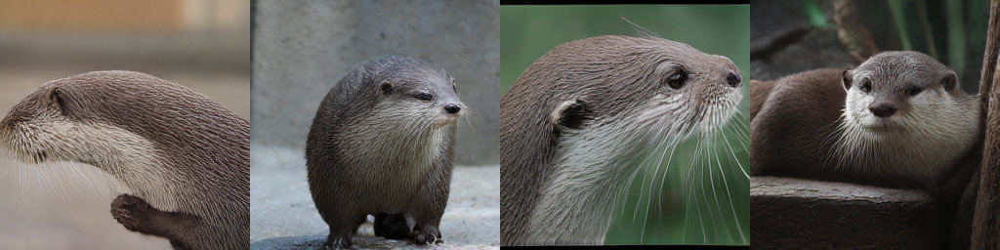

class 417, balloon


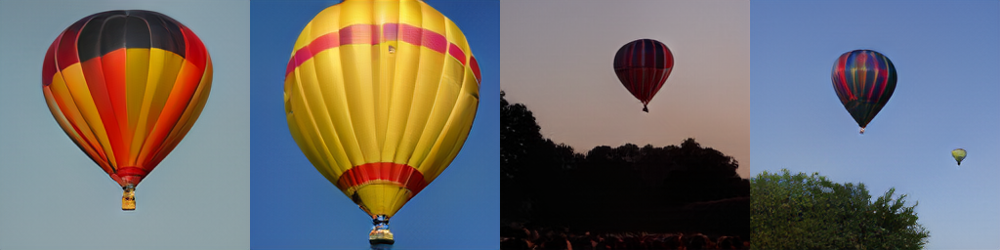

class 562, fountain


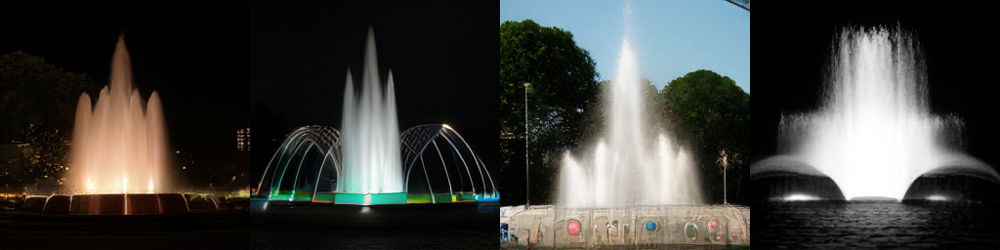

class 928, ice cream, icecream


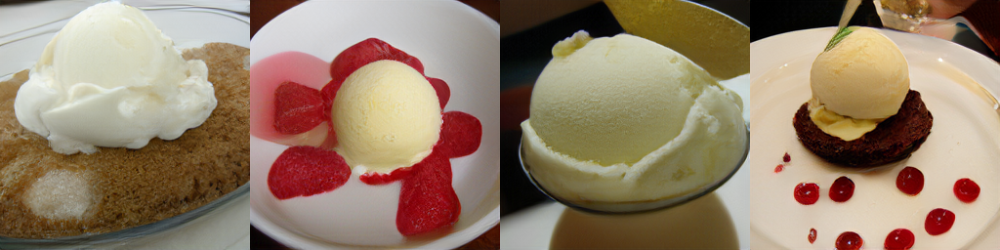

class 947, mushroom


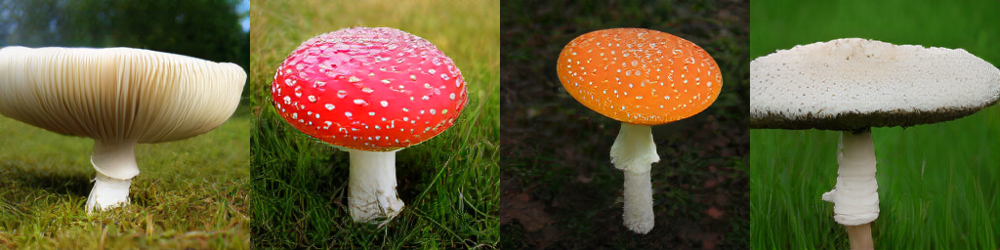

class 970, alp


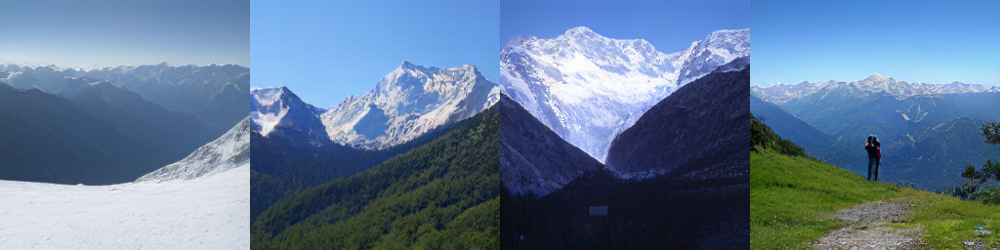

class 972, cliff, drop, drop-off


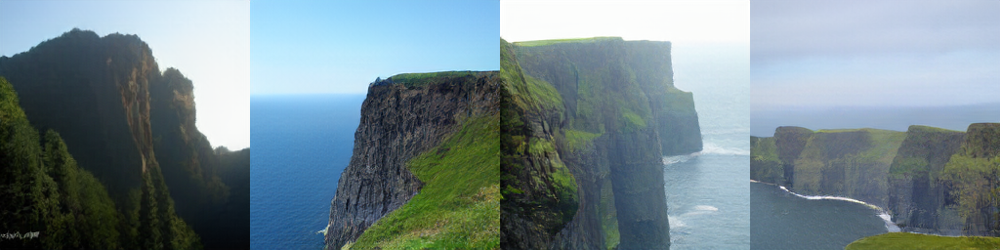

class 973, coral reef


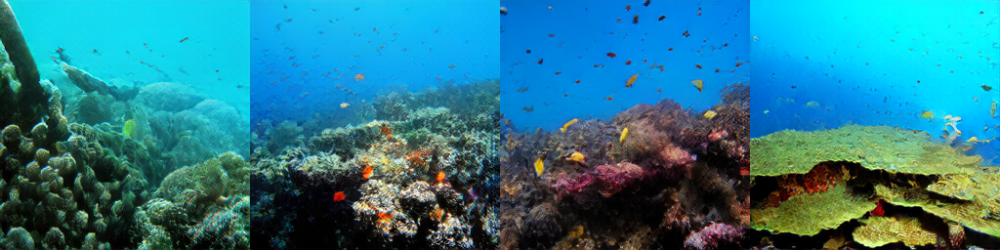

class 975, lakeside, lakeshore


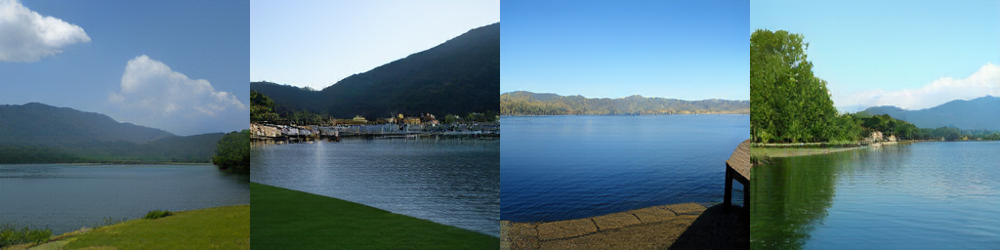

class 980, volcano


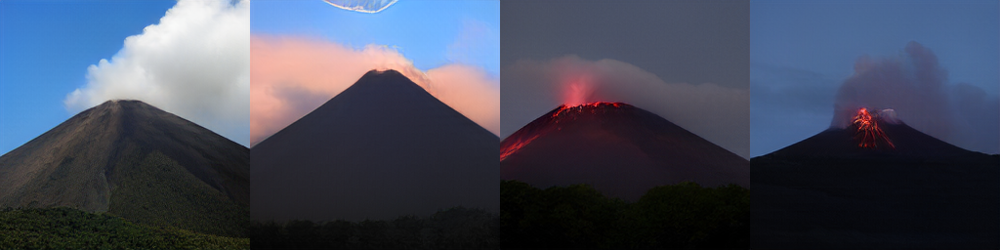

In [23]:
# Simple inference mode, controlled by three parameters.
guidance_scale = 2.5  # controls classifier-free guidance
temperature = 3.5  # the temperature during token sampling
steps = 64  # number of inference passes through the network, max. 256

generated_images = demo_utils.sample(
    generator=generator,
    tokenizer=tokenizer,
    config=demo_config,
    labels=labels,
    samples_per_class=4,
    guidance_scale=guidance_scale,
    temperature=temperature,
    steps=steps,
    device=device,
)

generated_images = demo_utils.visualize_generation(generated_images)

for i in range(len(generated_images)):
    print(f"class {labels[i].item()}, {imagenet_classes.imagenet_idx2classname[labels[i].item()]}")
    display(generated_images[i])